<h1>Imports</h1>

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import missingno as msno
from sklearn.svm import SVC
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from mlxtend.plotting import plot_decision_regions
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.ensemble import RandomForestClassifier, IsolationForest
from sklearn.neighbors import KNeighborsClassifier, LocalOutlierFactor
from sklearn.model_selection import train_test_split, KFold, cross_val_score
from sklearn.feature_selection import SelectFromModel, SequentialFeatureSelector
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, ConfusionMatrixDisplay

<h1>Dataset</h1>

In [2]:
df = pd.read_csv('diabetes.csv')
df.index = df.index + 1

In [3]:
df.head(5)

,Age,Gender,Polyuria,Polydipsia,sudden weight loss,weakness,Polyphagia,Genital thrush,visual blurring,Itching,Irritability,delayed healing,partial paresis,muscle stiffness,Alopecia,Obesity,class
1,40,Male,No,Yes,No,Yes,No,No,No,Yes,No,Yes,No,Yes,Yes,Yes,Positive
2,58,Male,No,No,No,Yes,No,No,Yes,No,No,No,Yes,No,Yes,No,Positive
3,41,Male,Yes,No,No,Yes,Yes,No,No,Yes,No,Yes,No,Yes,Yes,No,Positive
4,45,Male,No,No,Yes,Yes,Yes,Yes,No,Yes,No,Yes,No,No,No,No,Positive
5,60,Male,Yes,Yes,Yes,Yes,Yes,No,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Positive


In [4]:
df.describe()

,Age
count,520.000000
mean,48.028846
std,12.151466
min,16.000000
25%,39.000000
50%,47.500000
75%,57.000000
max,90.000000


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 520 entries, 1 to 520
Data columns (total 17 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   Age                 520 non-null    int64 
 1   Gender              520 non-null    object
 2   Polyuria            520 non-null    object
 3   Polydipsia          520 non-null    object
 4   sudden weight loss  520 non-null    object
 5   weakness            520 non-null    object
 6   Polyphagia          520 non-null    object
 7   Genital thrush      520 non-null    object
 8   visual blurring     520 non-null    object
 9   Itching             520 non-null    object
 10  Irritability        520 non-null    object
 11  delayed healing     520 non-null    object
 12  partial paresis     520 non-null    object
 13  muscle stiffness    520 non-null    object
 14  Alopecia            520 non-null    object
 15  Obesity             520 non-null    object
 16  class               520 no

<h1>EDA</h1>

<Axes: >

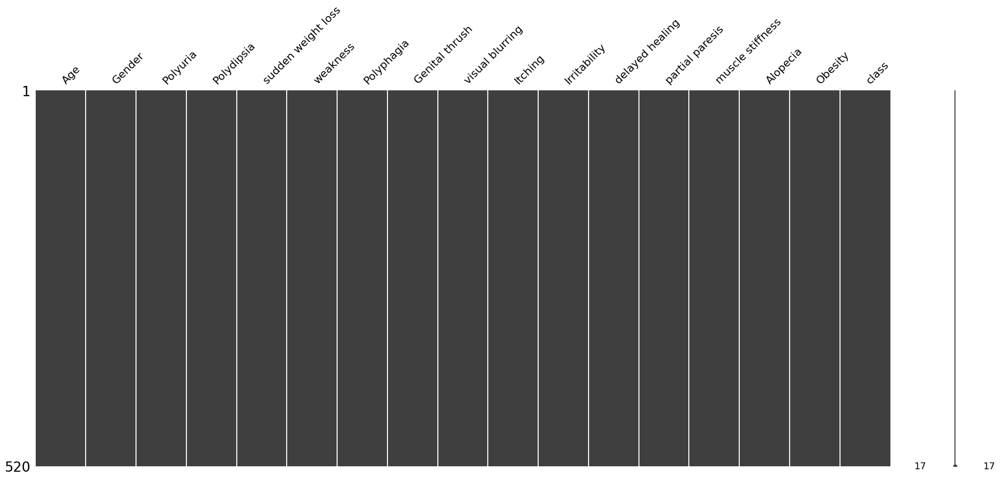

In [6]:
msno.matrix(df)

In [7]:
'''
Looking at the missing values in the dataset, we can see that 
there are no missing values in the dataset.
'''

df.isnull().sum()

Age                   0
Gender                0
Polyuria              0
Polydipsia            0
sudden weight loss    0
weakness              0
Polyphagia            0
Genital thrush        0
visual blurring       0
Itching               0
Irritability          0
delayed healing       0
partial paresis       0
muscle stiffness      0
Alopecia              0
Obesity               0
class                 0
dtype: int64

In [8]:
'''
Encode of categorical variables in the DataFrame `df` using one-hot encoding
'''
df_dummies = pd.get_dummies(df, drop_first=True)
df_encoded = pd.DataFrame(df_dummies)
df_encoded.columns = df.columns
df_encoded.head(5)

,Age,Gender,Polyuria,Polydipsia,sudden weight loss,weakness,Polyphagia,Genital thrush,visual blurring,Itching,Irritability,delayed healing,partial paresis,muscle stiffness,Alopecia,Obesity,class
1,40,True,False,True,False,True,False,False,False,True,False,True,False,True,True,True,True
2,58,True,False,False,False,True,False,False,True,False,False,False,True,False,True,False,True
3,41,True,True,False,False,True,True,False,False,True,False,True,False,True,True,False,True
4,45,True,False,False,True,True,True,True,False,True,False,True,False,False,False,False,True
5,60,True,True,True,True,True,True,False,True,True,True,True,True,True,True,True,True


In [9]:
'''
Correlation matrix to identify the relationship between the variables 
in the DataFrame `df_encoded`
'''
df_encoded.corr()

,Age,Gender,Polyuria,Polydipsia,sudden weight loss,weakness,Polyphagia,Genital thrush,visual blurring,Itching,Irritability,delayed healing,partial paresis,muscle stiffness,Alopecia,Obesity,class
Age,1.000000,0.062872,0.199781,0.137382,0.064808,0.224596,0.315577,0.096519,0.402729,0.296559,0.201625,0.257501,0.232742,0.307703,0.321691,0.140458,0.108679
Gender,0.062872,1.000000,-0.268894,-0.312262,-0.281840,-0.124490,-0.219968,0.208961,-0.208092,-0.052496,-0.013735,-0.101978,-0.332288,-0.090542,0.327871,-0.005396,-0.449233
Polyuria,0.199781,-0.268894,1.000000,0.598609,0.447207,0.263000,0.373873,0.087273,0.235095,0.088289,0.237740,0.149873,0.441664,0.152938,-0.144192,0.126567,0.665922
Polydipsia,0.137382,-0.312262,0.598609,1.000000,0.405965,0.332453,0.316839,0.028081,0.331250,0.128716,0.203446,0.115691,0.442249,0.180723,-0.310964,0.098691,0.648734
sudden weight loss,0.064808,-0.281840,0.447207,0.405965,1.000000,0.282884,0.243511,0.089858,0.068754,-0.004516,0.140340,0.088140,0.264014,0.109756,-0.202727,0.169294,0.436568
weakness,0.224596,-0.124490,0.263000,0.332453,0.282884,1.000000,0.180266,0.027780,0.301043,0.309440,0.146698,0.335507,0.272982,0.263164,0.090490,0.045665,0.243275
Polyphagia,0.315577,-0.219968,0.373873,0.316839,0.243511,0.180266,1.000000,-0.063712,0.293545,0.144390,0.239466,0.263980,0.373569,0.320031,-0.053498,0.029785,0.342504
Genital thrush,0.096519,0.208961,0.087273,0.028081,0.089858,0.027780,-0.063712,1.000000,-0.148408,0.125336,0.160551,0.136111,-0.195612,-0.100188,0.204847,0.053828,0.110288
visual blurring,0.402729,-0.208092,0.235095,0.331250,0.068754,0.301043,0.293545,-0.148408,1.000000,0.291191,0.077095,0.177767,0.364156,0.412369,0.014604,0.109005,0.251300
Itching,0.296559,-0.052496,0.088289,0.128716,-0.004516,0.309440,0.144390,0.125336,0.291191,1.000000,0.114006,0.453316,0.116669,0.215575,0.266506,0.001894,-0.013384


Text(0.5, 1.0, 'Correlation matrix')

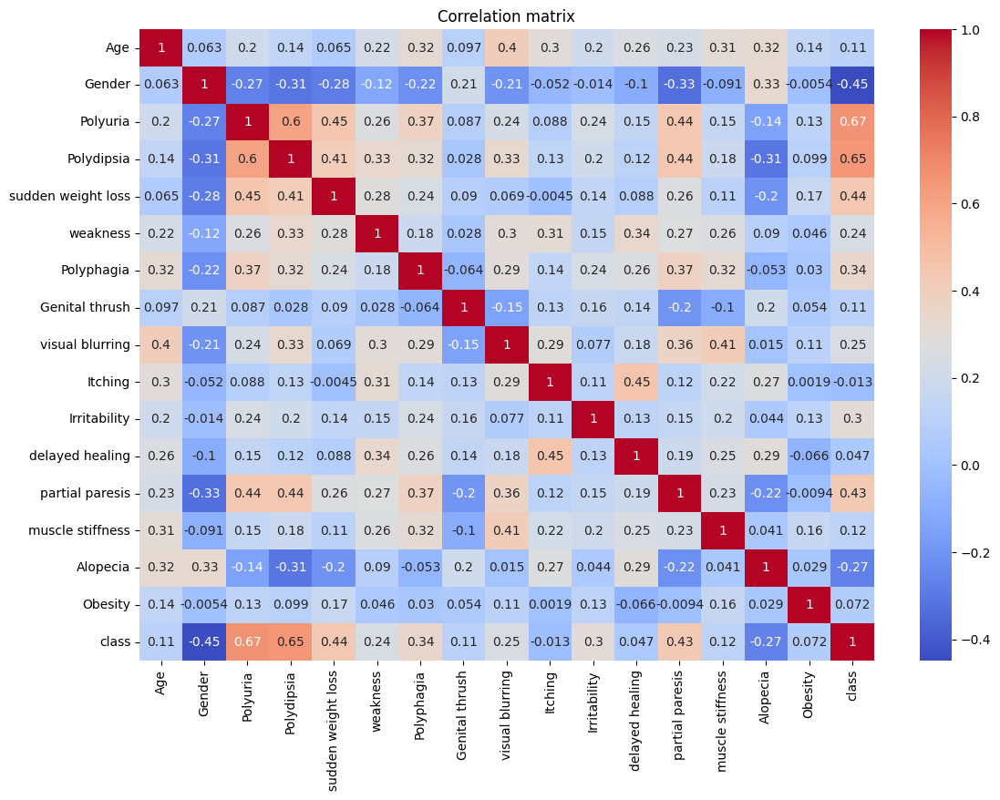

In [10]:
plt.figure(figsize=(13, 9))
sns.heatmap(df_encoded.corr(), annot=True, cmap='coolwarm')
plt.title('Correlation matrix')


In [11]:
'''
Matrix of correlation of the variables with the target 
variable `class` (Diabetes/No Diabetes)
'''

corr_matrix = df_encoded.corr()
correlation_with_target = corr_matrix['class'].sort_values(ascending=False)
correlation_with_target

class                 1.000000
Polyuria              0.665922
Polydipsia            0.648734
sudden weight loss    0.436568
partial paresis       0.432288
Polyphagia            0.342504
Irritability          0.299467
visual blurring       0.251300
weakness              0.243275
muscle stiffness      0.122474
Genital thrush        0.110288
Age                   0.108679
Obesity               0.072173
delayed healing       0.046980
Itching              -0.013384
Alopecia             -0.267512
Gender               -0.449233
Name: class, dtype: float64

<h3>Heatmap insights</h3>
<p>1. Polyuria and Polydipsia exhibit the highest correlations with the 'class' variable, indicating a strong association with the presence of diabetes.</p>
<p>2. Obesity shows a weak correlation with other variables, suggesting it does not significantly influence the presence of diabetes.</p>
<p>3. Partial paresis and sudden weight loss also demonstrate strong correlations with the 'class' variable, indicating their association with diabetes.</p>
<p>4. Diabetes appears to be more frequent among females.</p>


In [12]:
'''
Normalization of the numerical variables in the DataFrame `df_encoded` 
so they fit in a similar scale.
'''

scaler = StandardScaler()
numeric_columns = df_encoded.select_dtypes(include=['int64', 'float64']).columns
df_encoded[numeric_columns] = scaler.fit_transform(df[numeric_columns])

In [13]:
df_encoded.head(5)

,Age,Gender,Polyuria,Polydipsia,sudden weight loss,weakness,Polyphagia,Genital thrush,visual blurring,Itching,Irritability,delayed healing,partial paresis,muscle stiffness,Alopecia,Obesity,class
1,-0.661367,True,False,True,False,True,False,False,False,True,False,True,False,True,True,True,True
2,0.821362,True,False,False,False,True,False,False,True,False,False,False,True,False,True,False,True
3,-0.578993,True,True,False,False,True,True,False,False,True,False,True,False,True,True,False,True
4,-0.249498,True,False,False,True,True,True,True,False,True,False,True,False,False,False,False,True
5,0.986110,True,True,True,True,True,True,False,True,True,True,True,True,True,True,True,True


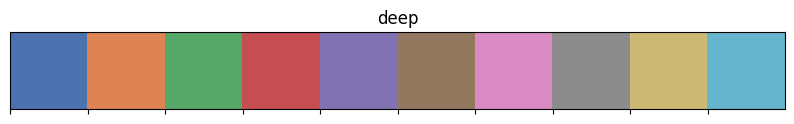

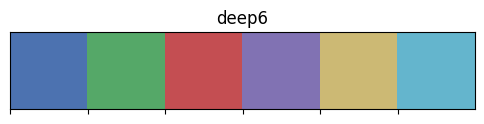

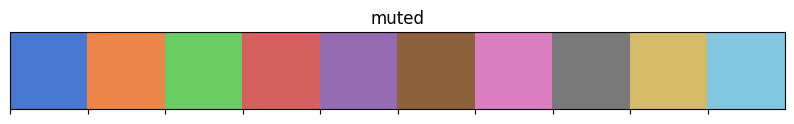

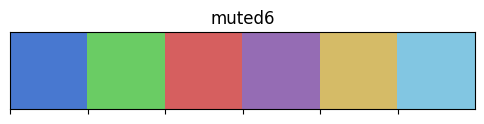

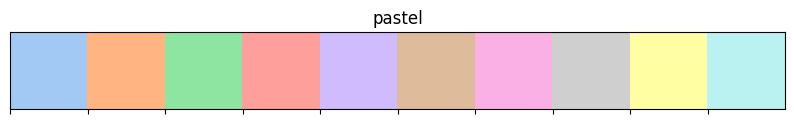

...

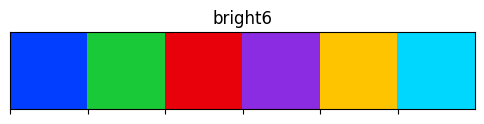

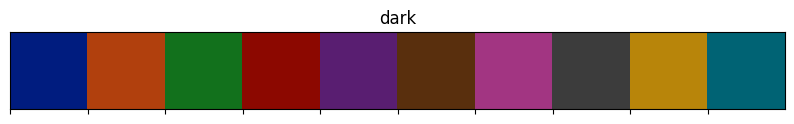

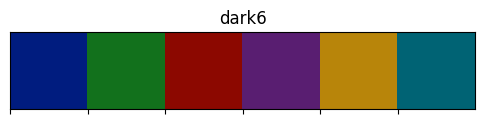

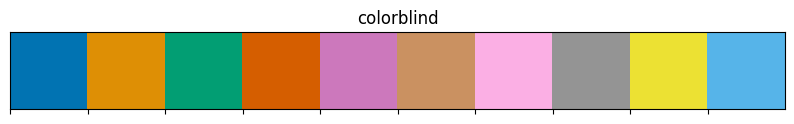

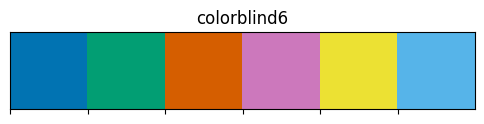

In [14]:
import seaborn as sns
import matplotlib.pyplot as plt

# Listar algunas paletas disponibles
palettes = list(sns.palettes.SEABORN_PALETTES.keys())

# Visualizar las paletas
for palette in palettes:
    sns.palplot(sns.color_palette(palette))
    plt.title(palette)
    plt.show()

<h2> Data distributions</h2>
<h3>'Class' variable distribution</h3>
<p>The 'class' variable is the object and dependent variable.</p>

/var/folders/fq/5zs7fhh97j9fjl57d38bly_c0000gn/T/ipykernel_73557/3774859725.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  axe = sns.countplot(x='class', data=df, palette='dark6')


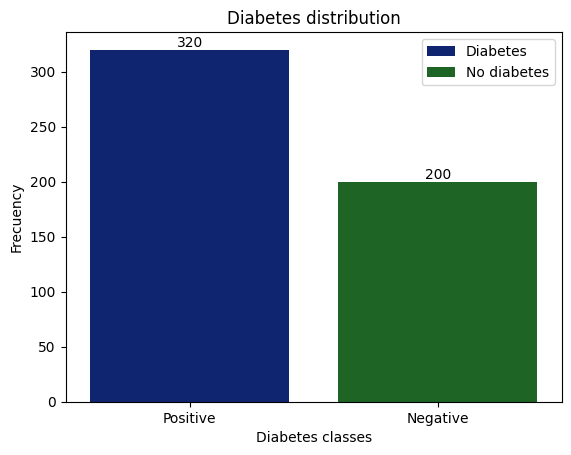

In [15]:
axe = sns.countplot(x='class', data=df, palette='dark6')
plt.title('Diabetes distribution')
plt.xlabel('Diabetes classes')
plt.ylabel('Frecuency')
plt.legend(['Diabetes', 'No diabetes'])

for container in axe.containers:
    axe.bar_label(container)

<Axes: ylabel='count'>

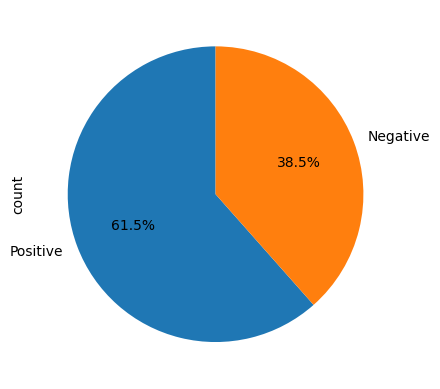

In [16]:
df['class'].value_counts().plot.pie(autopct='%1.1f%%', startangle=90)

<p>There are more individuals with Diabetes, 61.5% versus 38.5%</p>

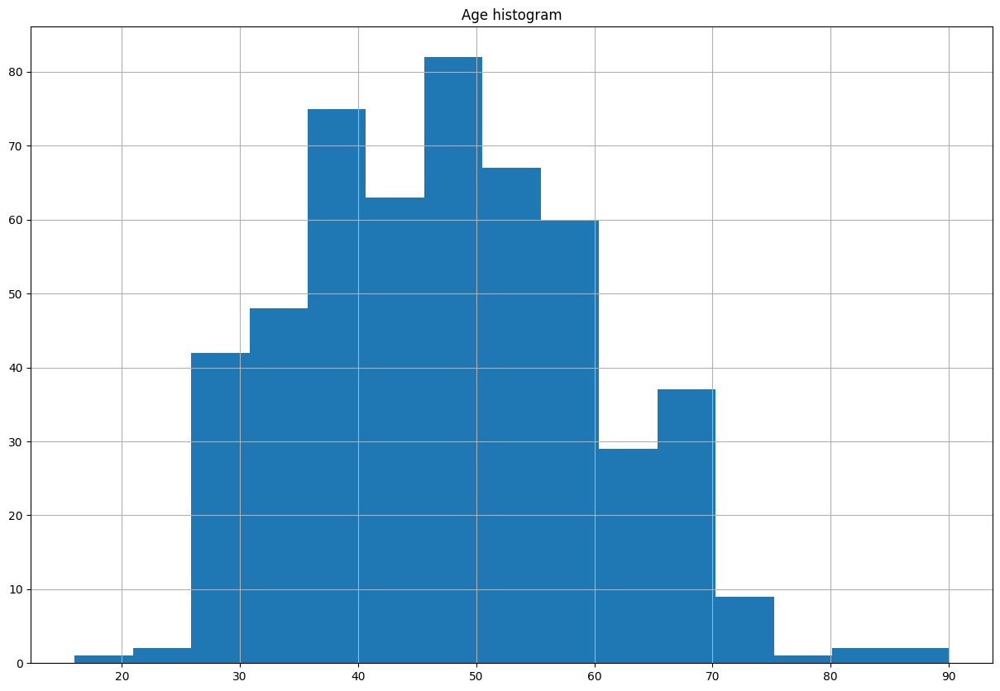

In [17]:
df.hist(bins=15, figsize=(15, 10))
plt.title('Age histogram')
plt.show()

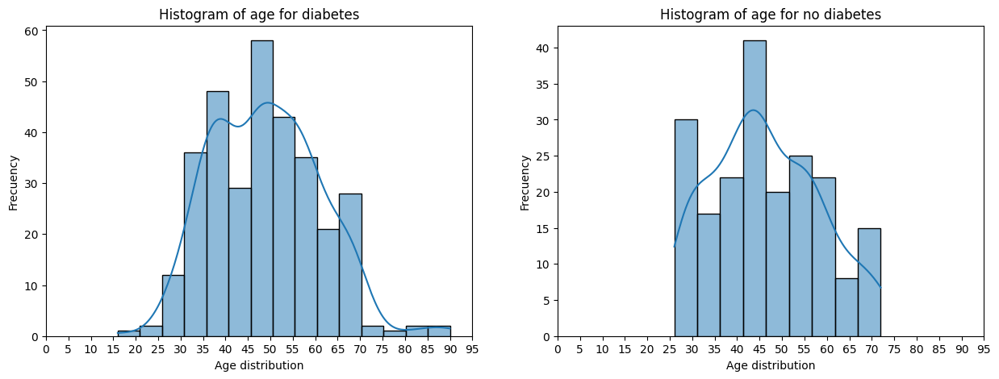

In [18]:
df_diabetes = df[df['class'] == 'Positive']
df_no_diabetes = df[df['class'] == 'Negative']

fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_size_inches(15, 5)
sns.histplot(df_diabetes['Age'], kde=True, ax=ax1)
ax1.set_title('Histogram of age for diabetes')
ax1.set_xlabel('Age distribution')
ax1.set_ylabel('Frecuency')
ax1.set_xticks(range(0, 100, 5))

sns.histplot(df_no_diabetes['Age'], kde=True, ax=ax2)
ax2.set_title('Histogram of age for no diabetes')
ax2.set_xlabel('Age distribution')
ax2.set_ylabel('Frecuency')
ax2.set_xticks(range(0, 100, 5))

<p>1. The range of 45 to 50 focuses the most of people with diabetes.
<p>2. The range of 40 to 45 focuses the most of people with no diabetes.

<h2>Selection of the Most Important Features</h2>

In [19]:
'''
Separation of the dataset into the input 
variables `X` and the target variable `y`
'''

X = df_encoded.drop('class', axis=1)
y = df_encoded['class']

<h3>1. Random Forest technique</h3>
<p>Useful for determining the importance of each feature individually.</p>

In [20]:
random_forest_model = RandomForestClassifier()
random_forest_model.fit(X, y)

RandomForestClassifier()

In [21]:
'''
Importance of the features in the dataset acording to 
the Random Forest model algorithm.
'''

feature_importances = random_forest_model.feature_importances_
feature_names = X.columns
random_forest_importances = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})
random_forest_importances = random_forest_importances.sort_values(by='Importance', ascending=False)
random_forest_importances

,Feature,Importance
2,Polyuria,0.217890
3,Polydipsia,0.191283
1,Gender,0.100679
0,Age,0.091895
4,sudden weight loss,0.061867
12,partial paresis,0.048752
10,Irritability,0.040500
14,Alopecia,0.035888
11,delayed healing,0.034813
6,Polyphagia,0.033936


/var/folders/fq/5zs7fhh97j9fjl57d38bly_c0000gn/T/ipykernel_73557/1454232633.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='Importance', y='Feature', data=random_forest_importances, palette='dark6')


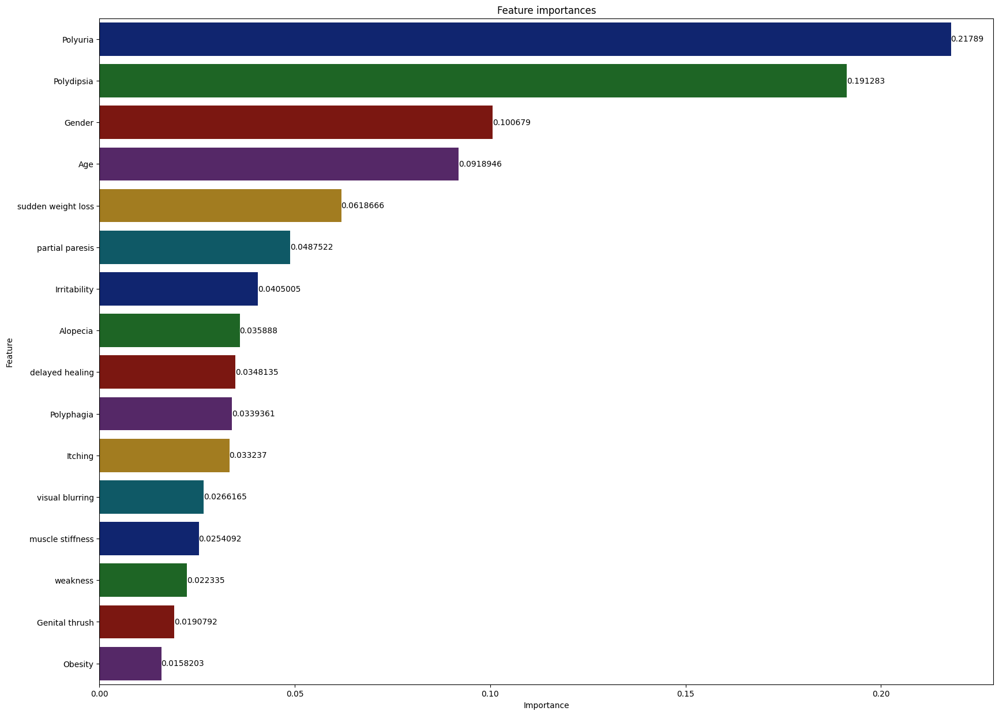

In [22]:
'''
Visualization of the importance of the features in the dataset
'''

plt.figure(figsize=(20, 15))
ax = sns.barplot(x='Importance', y='Feature', data=random_forest_importances, palette='dark6')
plt.title('Feature importances')
plt.xlabel('Importance')
plt.ylabel('Feature')
# plt.gca().invert_yaxis()
for container in ax.containers:
    ax.bar_label(container)


<h3>2. Feature Selection Based on Model technique.</h3>
<p>This method directly identifies the most important features from a pre-fitted model, in this case a RandomForest model.</p>

In [23]:
feature_selection_model = SelectFromModel(random_forest_model, prefit=True)
selected_features = X.columns[feature_selection_model.get_support()]
selected_features

Index(['Age', 'Gender', 'Polyuria', 'Polydipsia'], dtype='object')

<h3>3. Sequential Feature Selector technique</h3>
<p>This technique is useful for selecting the most relevant features using a logistic regression model.</p>

In [24]:
logistic_regression_model = LogisticRegression()

sequential_feature_selector = SequentialFeatureSelector(logistic_regression_model, n_features_to_select=6, direction='forward')
sequential_feature_selector.fit(X, y)
selected_features = X.columns[sequential_feature_selector.get_support()]
selected_features

Index(['Gender', 'Polyuria', 'Polydipsia', 'Polyphagia', 'delayed healing',
       'Alopecia'],
      dtype='object')

<p>*****************************************************************</p>

                   Feature  Importance
2             Polyuria_Yes    0.224282
3           Polydipsia_Yes    0.182632
0                      Age    0.105534
1                   Gender    0.095169
12     partial paresis_Yes    0.059099
4   sudden weight loss_Yes    0.050188
10        Irritability_Yes    0.041007
14            Alopecia_Yes    0.039485
9              Itching_Yes    0.031541
11     delayed healing_Yes    0.030572
6           Polyphagia_Yes    0.030325
8      visual blurring_Yes    0.028996
7       Genital thrush_Yes    0.022104
13    muscle stiffness_Yes    0.021899
5             weakness_Yes    0.019793
15             Obesity_Yes    0.017375


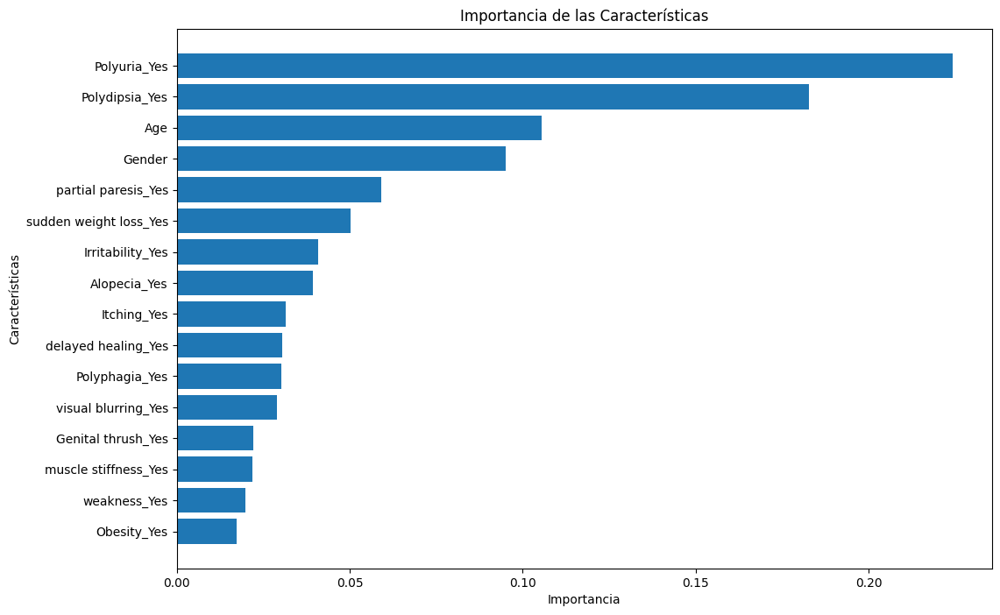

Index(['Age', 'Gender', 'Polyuria_Yes', 'Polydipsia_Yes'], dtype='object')


/Users/noble/opt/anaconda3/envs/fordatascience/lib/python3.11/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Index(['Age', 'Gender', 'Polyuria_Yes', 'Polydipsia_Yes', 'Polyphagia_Yes',
       'visual blurring_Yes', 'Itching_Yes', 'Irritability_Yes',
       'delayed healing_Yes', 'Alopecia_Yes'],
      dtype='object')


In [25]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectFromModel, SequentialFeatureSelector
from sklearn.linear_model import LogisticRegression

# Cargar el dataset
df = pd.read_csv('diabetes.csv')

# Convertir la columna Gender a valores numéricos
df['Gender'] = df['Gender'].map({'Male': 1, 'Female': 0})

# Codificar variables categóricas usando one-hot encoding
df = pd.get_dummies(df, columns=['Polyuria', 'Polydipsia', 'sudden weight loss', 'weakness', 'Polyphagia', 'Genital thrush', 'visual blurring', 'Itching', 'Irritability', 'delayed healing', 'partial paresis', 'muscle stiffness', 'Alopecia', 'Obesity'], drop_first=True)

# Separar características y variable objetivo
X = df.drop('class', axis=1)
y = df['class']

# Entrenar un modelo de Random Forest
model = RandomForestClassifier()
model.fit(X, y)

# Obtener la importancia de las características
importances = model.feature_importances_
feature_names = X.columns

# Crear un DataFrame con las importancias
feature_importances = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
feature_importances = feature_importances.sort_values(by='Importance', ascending=False)

# Mostrar las importancias de las características
print(feature_importances)

# Graficar las importancias de las características
plt.figure(figsize=(12, 8))
plt.barh(feature_importances['Feature'], feature_importances['Importance'])
plt.xlabel('Importancia')
plt.ylabel('Características')
plt.title('Importancia de las Características')
plt.gca().invert_yaxis()
plt.show()

# Usar SelectFromModel para seleccionar características importantes
selector = SelectFromModel(model, prefit=True)
X_selected = selector.transform(X)

# Mostrar las características seleccionadas
selected_features = X.columns[selector.get_support()]
print(selected_features)

# Crear un modelo de regresión logística
logistic_model = LogisticRegression(max_iter=1000)

# Usar SequentialFeatureSelector para seleccionar características
sfs = SequentialFeatureSelector(logistic_model, n_features_to_select=10, direction='forward')
sfs.fit(X, y)

# Mostrar las características seleccionadas
selected_features = X.columns[sfs.get_support()]
print(selected_features)

<h1>Modeling</h1>

In [26]:
'''
Separation of the dataset into the input variables `X` and the target variable `y`
for training and testing the models.
'''
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, random_state=42)

In [27]:
scaler = StandardScaler()
X_scaled = scaler.fit(X_train)
X_scaled = scaler.transform(X_test)

In [ ]:
'''
Removal of outliers in the dataset using the Isolation Forest algorithm.
'''
iso_forest = IsolationForest(contamination=0.05, random_state=42)
outliers = iso_forest.fit_predict(X_scaled)
X_scaled_filtered = X_scaled[outliers == 1]
y_test_filtered = y_test[outliers == 1]

print(outliers)
print(X_scaled_filtered)
print(y_test_filtered)

[ 1  1  1 -1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1 -1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
 -1 -1  1  1  1  1  1  1  1  1  1  1  1  1  1  1 -1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1 -1
  1  1  1  1  1  1  1  1]
[[ 1.94204993  0.73923501  1.02927447 ...  1.28439929  1.31789306
  -0.43424812]
 [-0.67752335 -1.35274978  1.02927447 ... -0.77857409 -0.75878691
  -0.43424812]
 [ 0.71412496  0.73923501  1.02927447 ... -0.77857409 -0.75878691
  -0.43424812]
 ...
 [ 1.45087994  0.73923501  1.02927447 ...  1.28439929 -0.75878691
  -0.43424812]
 [-0.18635336  0.73923501 -0.97155815 ... -0.77857409  1.31789306
  -0.43424812]
 [-1.49614     0.73923501 -0.97155815 ... -0.77857409 -0.75878691
  -0.43424812]]
275    Negative
93     Positive
6      Positive
90     Positive
513    Positive
         ...   
69     Positive
357    Negative
423    Positive
334    Negative
227    Negative
Name: class, L

In [69]:
'''
Removal of outliers in the dataset using the Local Outlier Factor (LOF) algorithm.
'''

lof = LocalOutlierFactor(contamination=0.05, n_neighbors=20)
outliers = lof.fit_predict(X_scaled)

X_scaled_filtered = X_scaled[outliers == 1]
y_test_filtered = y_test[outliers == 1]
print(outliers)
print(X_scaled_filtered)
print(y_test_filtered)

[ 1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1 -1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1 -1  1  1  1  1  1 -1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
 -1  1  1 -1  1  1 -1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1]
[[ 1.94204993  0.73923501  1.02927447 ...  1.28439929  1.31789306
  -0.43424812]
 [-0.67752335 -1.35274978  1.02927447 ... -0.77857409 -0.75878691
  -0.43424812]
 [ 0.71412496  0.73923501  1.02927447 ... -0.77857409 -0.75878691
  -0.43424812]
 ...
 [ 1.45087994  0.73923501  1.02927447 ...  1.28439929 -0.75878691
  -0.43424812]
 [-0.18635336  0.73923501 -0.97155815 ... -0.77857409  1.31789306
  -0.43424812]
 [-1.49614     0.73923501 -0.97155815 ... -0.77857409 -0.75878691
  -0.43424812]]
275    Negative
93     Positive
6      Positive
167    Positive
90     Positive
         ...   
69     Positive
357    Negative
423    Positive
334    Negative
227    Negative
Name: class, L

<h2>1. Logistic Regression</h2>

In [28]:
logistic_model = LogisticRegression(max_iter=1000)
logistic_model.fit(X_train, y_train)

LogisticRegression(max_iter=1000)

In [29]:
logistic_model_prediction = logistic_model.predict(X_test)

In [30]:
logistic_accuracy_score = accuracy_score(y_test, logistic_model_prediction)
logistic_matrix_score = confusion_matrix(y_test, logistic_model_prediction)
logistic_classification_report = classification_report(y_test, logistic_model_prediction)

In [31]:
print(f'''
      Accuracy Score: {logistic_accuracy_score:.2f}
      **********
      Confusion Matrix: {logistic_matrix_score}
      **********
      Classification report: {logistic_classification_report}
      ''')


      Accuracy Score: 0.92
      **********
      Confusion Matrix: [[28  5]
 [ 3 68]]
      **********
      Classification report:               precision    recall  f1-score   support

    Negative       0.90      0.85      0.88        33
    Positive       0.93      0.96      0.94        71

    accuracy                           0.92       104
   macro avg       0.92      0.90      0.91       104
weighted avg       0.92      0.92      0.92       104

      


<h3>Charts</h3>

Text(0.5, 1.0, 'Confusion Matrix - Logistic Regression')

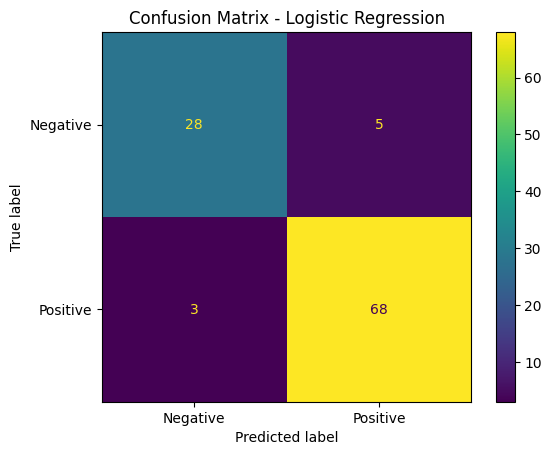

In [32]:
ConfusionMatrixDisplay.from_estimator(logistic_model, X_test, y_test)
plt.title('Confusion Matrix - Logistic Regression')

Text(0.5, 1.0, 'Logistic Regression Predictions vs Actual')

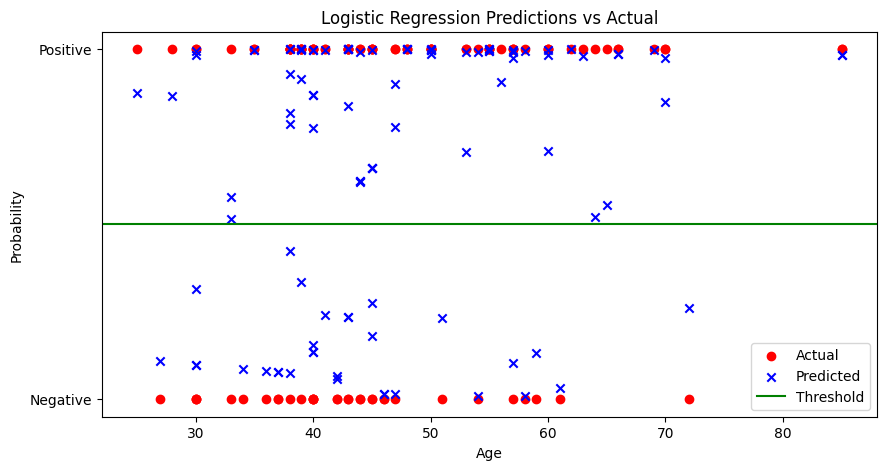

In [33]:
'''
Visualization of the predictions of the Logistic Regression model
'''

predictions = logistic_model.predict_proba(X_test)[:, 1]
plt.figure(figsize=(10, 5))
plt.scatter(X_test['Age'], y_test, color='red', marker='o', label='Actual')
plt.scatter(X_test['Age'], predictions, color='blue', marker='x', label='Predicted')
plt.axhline(y=0.5, color='green', linestyle='-', label='Threshold')
plt.xlabel('Age')
plt.ylabel('Probability')
plt.legend()
plt.title('Logistic Regression Predictions vs Actual')

<h3>Logistic Regression Model Insights</h3>
<p>1. The model has a very acceptable accuracy rate of 92%.</p>
<p>2. The model is better at predicting Diabetes cases than No Diabetes cases.</p>


<h2>2. Decision Tree</h2>

In [34]:
decision_tree_model = DecisionTreeClassifier()
decision_tree_model.fit(X_train, y_train)

DecisionTreeClassifier()

In [35]:
decision_tree_model_prediction = decision_tree_model.predict(X_test)

In [36]:
decision_tree_model_accuracy = accuracy_score(y_test, decision_tree_model_prediction)
decision_tree_model_matrix = confusion_matrix(y_test, decision_tree_model_prediction)
decision_tree_model_classification_report = classification_report(y_test, decision_tree_model_prediction)

In [37]:
print(f'''
      Accuracy Score: {decision_tree_model_accuracy:.2f}
      **********
      Confusion Matrix: {decision_tree_model_matrix}
      **********
      Classification report: {decision_tree_model_classification_report}
      ''')


      Accuracy Score: 0.95
      **********
      Confusion Matrix: [[32  1]
 [ 4 67]]
      **********
      Classification report:               precision    recall  f1-score   support

    Negative       0.89      0.97      0.93        33
    Positive       0.99      0.94      0.96        71

    accuracy                           0.95       104
   macro avg       0.94      0.96      0.95       104
weighted avg       0.95      0.95      0.95       104

      


<h3>Charts</h3>

Text(0.5, 1.0, 'Confusion Matrix - Decision Tree')

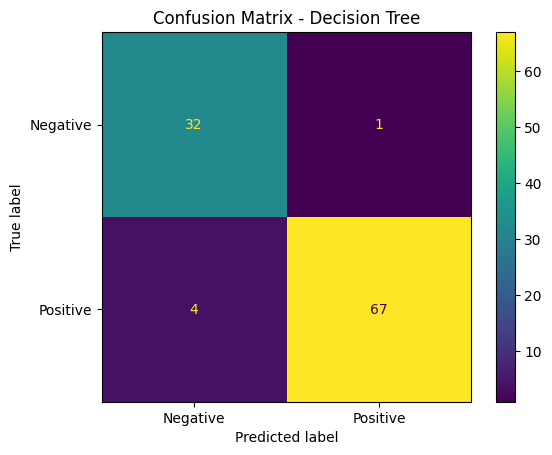

In [38]:
ConfusionMatrixDisplay.from_estimator(decision_tree_model, X_test, y_test)
plt.title('Confusion Matrix - Decision Tree')

In [39]:
'''
Getting the classes in the correct order for the Decision Tree model chart.
'''

print(decision_tree_model.classes_)

['Negative' 'Positive']


In [40]:
'''
Visualization of the Decision Tree model
'''

plt.figure(figsize=(250, 100))
plot_tree(decision_tree_model, filled=True, feature_names=X_test.columns.to_list(), class_names=decision_tree_model.classes_, fontsize=60)

[Text(0.649609375, 0.95, 'Polyuria_Yes <= 0.5\ngini = 0.481\nsamples = 416\nvalue = [167, 249]\nclass = Positive'),
 Text(0.39921875, 0.85, 'Gender <= 0.5\ngini = 0.399\nsamples = 214\nvalue = [155.0, 59.0]\nclass = Negative'),
 Text(0.5244140625, 0.8999999999999999, 'True  '),
 Text(0.1625, 0.75, 'Alopecia_Yes <= 0.5\ngini = 0.44\nsamples = 49\nvalue = [16.0, 33.0]\nclass = Positive'),
 Text(0.1, 0.65, 'Age <= 34.5\ngini = 0.239\nsamples = 36\nvalue = [5, 31]\nclass = Positive'),
 Text(0.05, 0.55, 'muscle stiffness_Yes <= 0.5\ngini = 0.5\nsamples = 8\nvalue = [4, 4]\nclass = Negative'),
 Text(0.025, 0.45, 'gini = 0.0\nsamples = 4\nvalue = [4, 0]\nclass = Negative'),
 Text(0.075, 0.45, 'gini = 0.0\nsamples = 4\nvalue = [0, 4]\nclass = Positive'),
 Text(0.15, 0.55, 'Irritability_Yes <= 0.5\ngini = 0.069\nsamples = 28\nvalue = [1, 27]\nclass = Positive'),
 Text(0.125, 0.45, 'gini = 0.0\nsamples = 22\nvalue = [0, 22]\nclass = Positive'),
 Text(0.175, 0.45, 'Polydipsia_Yes <= 0.5\ngini = 0

<h3>Decision Tree Model Insights</h3>

<p>1. The model achieved an accuracy score of 0.95, indicating that 95% of the predictions made by the model are correct.</p>
<p>2. Overall, the Decision Tree model performs well, with high precision, recall, and F1-scores, especially for the Positive class.</p>
<p>3. The model is effective at correctly identifying both Positive and Negative cases, with a slight tendency to misclassify some Negative cases as Positive.</p>

<h2>3. Random Forest</h2>

In [41]:
random_forest_model = RandomForestClassifier()
random_forest_model.fit(X_train, y_train)

RandomForestClassifier()

In [42]:
random_forest_predict = random_forest_model.predict(X_test)

In [43]:
random_forest_accuracy = accuracy_score(y_test, random_forest_predict)
random_forest_matrix = confusion_matrix(y_test, random_forest_predict)
random_forest_classification_report = classification_report(y_test, random_forest_predict)

In [44]:
print(f'''
      Accuracy Score: {random_forest_accuracy:.2f}
      **********
      Confusion Matrix: {random_forest_matrix}
      **********
      Classification report: {random_forest_classification_report}
      ''')


      Accuracy Score: 0.99
      **********
      Confusion Matrix: [[33  0]
 [ 1 70]]
      **********
      Classification report:               precision    recall  f1-score   support

    Negative       0.97      1.00      0.99        33
    Positive       1.00      0.99      0.99        71

    accuracy                           0.99       104
   macro avg       0.99      0.99      0.99       104
weighted avg       0.99      0.99      0.99       104

      


<h3>Charts</h3>

In [45]:
plt.figure(figsize=(250, 100))
plot_tree(random_forest_model.estimators_[0], filled=True, feature_names=X_test.columns.to_list(), class_names=random_forest_model.classes_, fontsize=60)

[Text(0.6775265957446809, 0.9545454545454546, 'Polyuria_Yes <= 0.5\ngini = 0.469\nsamples = 256\nvalue = [156, 260]\nclass = Positive'),
 Text(0.535904255319149, 0.8636363636363636, 'Polydipsia_Yes <= 0.5\ngini = 0.423\nsamples = 133\nvalue = [147, 64]\nclass = Negative'),
 Text(0.6067154255319149, 0.9090909090909092, 'True  '),
 Text(0.4122340425531915, 0.7727272727272727, 'sudden weight loss_Yes <= 0.5\ngini = 0.339\nsamples = 114\nvalue = [138, 38]\nclass = Negative'),
 Text(0.2925531914893617, 0.6818181818181818, 'partial paresis_Yes <= 0.5\ngini = 0.318\nsamples = 97\nvalue = [121.0, 30.0]\nclass = Negative'),
 Text(0.20212765957446807, 0.5909090909090909, 'Irritability_Yes <= 0.5\ngini = 0.212\nsamples = 77\nvalue = [102, 14]\nclass = Negative'),
 Text(0.14893617021276595, 0.5, 'Polyphagia_Yes <= 0.5\ngini = 0.175\nsamples = 69\nvalue = [93, 10]\nclass = Negative'),
 Text(0.1276595744680851, 0.4090909090909091, 'visual blurring_Yes <= 0.5\ngini = 0.212\nsamples = 57\nvalue = [73,

<h3>Random Forest Model Insights</h3>

<p>1. The model achieved an accuracy score of 0.1, indicating that 100% of the predictions made by the model are correct.</p>

<h2>5. SVM (Support Vector Machine)</h2>

In [46]:
'''
Minimazing the number of features to 2 for dimension reduction using PCA 
(Principal Component Analysis)
'''
pca = PCA(n_components=2)
pca.fit(X_train)
X_train_pca = pca.transform(X_train)
X_test_pca = pca.transform(X_test)
y_train_for_svm = np.where(y_train == 'Positive', 1, 0)
y_test_for_svm = np.where(y_test == 'Positive', 1, 0)

In [47]:
'''
Training the Support Vector Machine model with the PCA transformed data
'''
svm_model = SVC(C=0.5, kernel='linear')
svm_model.fit(X_train_pca, y_train_for_svm)

SVC(C=0.5, kernel='linear')

In [48]:
svm_predict = svm_model.predict(X_test_pca)

In [49]:
svm_accuracy = accuracy_score(y_test_for_svm, svm_predict)
svm_matrix = confusion_matrix(y_test_for_svm, svm_predict)
svm_classification_report = classification_report(y_test_for_svm, svm_predict)

In [50]:
print(f'''
      Accuracy Score: {svm_accuracy:.2f}
      **********
      Confusion Matrix: {svm_matrix}
      **********
      Classification report: {svm_classification_report}
      ''')


      Accuracy Score: 0.85
      **********
      Confusion Matrix: [[26  7]
 [ 9 62]]
      **********
      Classification report:               precision    recall  f1-score   support

           0       0.74      0.79      0.76        33
           1       0.90      0.87      0.89        71

    accuracy                           0.85       104
   macro avg       0.82      0.83      0.83       104
weighted avg       0.85      0.85      0.85       104

      


<h3>Charts</h3>

Text(0.5, 1.0, 'Confusion Matrix - Support Vector Machine Model')

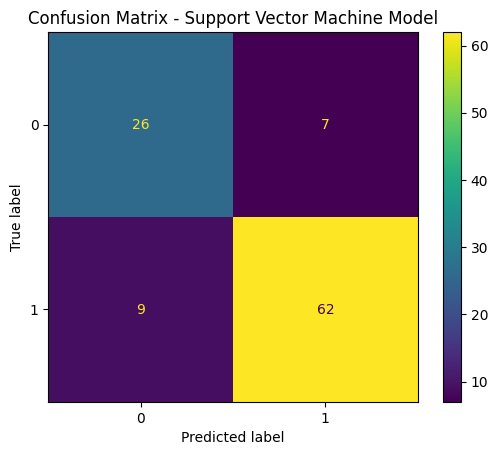

In [51]:
ConfusionMatrixDisplay.from_estimator(svm_model, X_test_pca, y_test_for_svm)
plt.title('Confusion Matrix - Support Vector Machine Model')


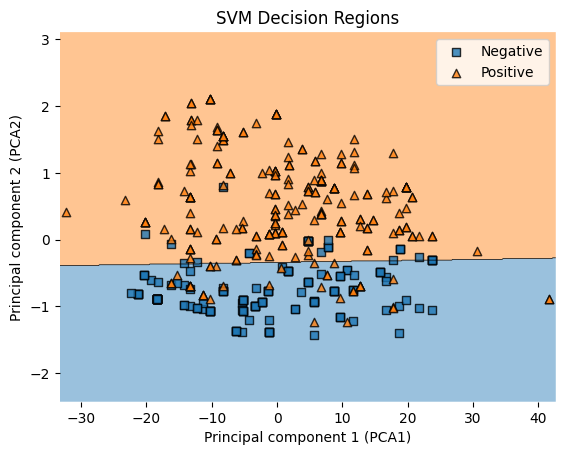

In [52]:
plot_decision_regions(X_train_pca, y_train_for_svm, clf=svm_model, legend=2)
plt.title('SVM Decision Regions')
plt.xlabel('Principal component 1 (PCA1)')
plt.ylabel('Principal component 2 (PCA2)')
plt.legend(['Negative', 'Positive'])


<h3>SVM Model Insights</h3>

<p>1. The model achieved an accuracy score of 0.85, indicating that 85% of the predictions made by the model are correct.</p>
<p>2. Only 70% of the Negative cases were predicted correctly, which means this model is not reliable for predicting No Diabetes cases.</p>

<h2>6. k-NN (k-Nearest Neighbors)</h2>

In [53]:
pca_knn = PCA(n_components=2)
pca_knn.fit(X_train)
X_train_pca_knn = pca_knn.transform(X_train)
X_test_pca_knn = pca_knn.transform(X_test)
y_train_for_knn = np.where(y_train == 'Positive', 1, 0)
y_test_for_knn = np.where(y_test == 'Positive', 1, 0)

In [54]:
knn_model = KNeighborsClassifier(n_neighbors=3)
knn_model.fit(X_train_pca_knn, y_train_for_knn)

KNeighborsClassifier(n_neighbors=3)

In [55]:
knn_predict = knn_model.predict(X_test_pca_knn)
knn_predict

array([0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1,
       1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1,
       0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1,
       0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1,
       0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0])

In [56]:
knn_accuracy = accuracy_score(y_test_for_knn, knn_predict)
knn_matrix = confusion_matrix(y_test_for_knn, knn_predict)
knn_classification_report = classification_report(y_test_for_knn, knn_predict)

kf_knn = KFold(n_splits=5, shuffle=True, random_state=42)
kfold_knn_scores = cross_val_score(knn_model, X_test_pca, y_test_for_knn, cv=kf_knn)
knn_kfold_std = np.std(kfold_knn_scores)
knn_kfold_mean = np.mean(kfold_knn_scores)

In [57]:
print(f'''
      Accuracy Score: {knn_accuracy:.2f}
      **********
      Confusion Matrix: {knn_matrix}
      **********
      Classification report: {knn_classification_report}
      **********
      KFold Scores: {kfold_knn_scores}
      KFold Standard Deviation: {knn_kfold_std:.2f}
      Kfold Mean: {knn_kfold_mean}
      ''')


      Accuracy Score: 0.87
      **********
      Confusion Matrix: [[27  6]
 [ 8 63]]
      **********
      Classification report:               precision    recall  f1-score   support

           0       0.77      0.82      0.79        33
           1       0.91      0.89      0.90        71

    accuracy                           0.87       104
   macro avg       0.84      0.85      0.85       104
weighted avg       0.87      0.87      0.87       104

      **********
      KFold Scores: [0.95238095 0.66666667 0.52380952 0.85714286 0.7       ]
      KFold Standard Deviation: 0.15
      Kfold Mean: 0.74
      


Text(0.5, 1.0, 'Confusion Matrix - K-Nearest Neighbors Model')

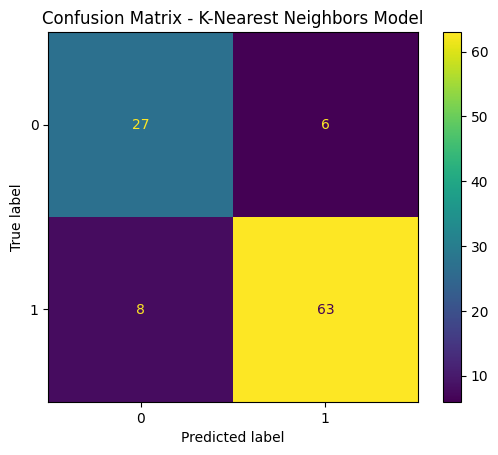

In [58]:
ConfusionMatrixDisplay.from_estimator(knn_model, X_test_pca_knn, y_test_for_knn)
plt.title('Confusion Matrix - K-Nearest Neighbors Model')

Text(0, 0.5, 'Principal component 2 (PCA2)')

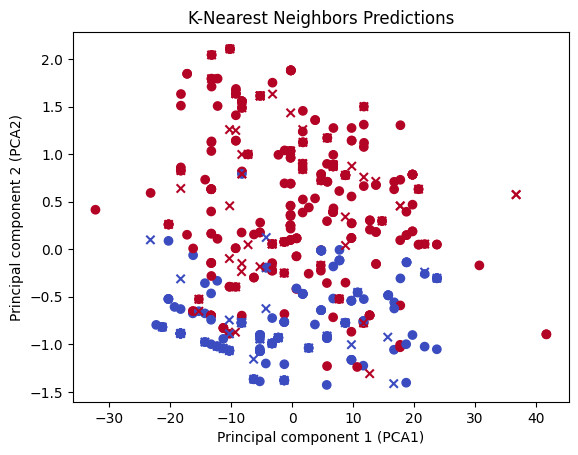

In [59]:
plt.scatter(X_train_pca_knn[:, 0], X_train_pca_knn[:, 1], c=y_train_for_knn, cmap='coolwarm')
plt.scatter(X_test_pca_knn[:, 0], X_test_pca_knn[:, 1], c=knn_predict, cmap='coolwarm', marker='x')
plt.title('K-Nearest Neighbors Predictions')
plt.xlabel('Principal component 1 (PCA1)')
plt.ylabel('Principal component 2 (PCA2)')

<h3>k-NN Model Insights</h3>

<p>1. The model achieved an accuracy score of 0.86, indicating that 86% of the predictions made by the model are correct.</p>
<p>2. This model has a high accuracy rate in predicting positive cases of diabetes but is less reliable in predicting negative cases.</p>